## Advanced Lane Finding Project : Visualize Results Notebook

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## This Notebook shows the different ways of analysis and also steps of analysis and their results


In [5]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

######################################################################################################################
# Section 1: Following section defines the data structure and parameters used in the file globally
######################################################################################################################
# Following coordinates are used to define the perspective transform's Source and Destination points
src = np.float32(
    [
        [1210, 710],  # Bottom right
        [160, 710],  # Bottom left
        [580, 460],  # Top left
        [735, 460]  # Top right
    ])

dst = np.float32(
    [
        [1020, 720],  # Bottom right
        [280, 720],  # Bottom left
        [280, 1],  # Top left
        [1020, 1],  # Top right
    ])

# Following class is used to store the data lane detection for frame
class Line:
    def __init__(self):
        self.detected = False

        self.left_fitx = np.array([])
        self.right_fitx = np.array([])

        self.ploty = np.array([])

        self.left_fit = np.array([])
        self.right_fit = np.array([])

        self.leftXHist_base = 0
        self.rightXHist_base = 0

        self.radius_of_curvature = 0
        self.veh_position_from_center = 0

        self.badFrameCount = 0

    # Following class methods are defined to optimize the use of data elements
    def getPreviousData(self):
        return self.left_fitx, self.right_fitx, self.ploty, self.left_fit, self.right_fit

    def wasLaneDetectedInLastFrame(self):
        return self.detected

    def getRadiusOfCurvature(self):
        return self.radius_of_curvature

    def getVehiclePositionFromCenter(self):
        return self.veh_position_from_center

    def getLastHistData(self):
        return self.leftXHist_base, self.rightXHist_base

    def getBadFrameCount(self):
        return self.badFrameCount

    def updateBadFrameCount(self, badFrameCount):
        self.badFrameCount = badFrameCount

    def saveRadiusOfCurvature(self, radius):
        self.radius_of_curvature = radius

    def saveVehiclePositionFromCenter(self, position):
        self.veh_position_from_center = position

    def saveHistBase(self, leftx_base, rightx_base):
        self.leftXHist_base = leftx_base
        self.rightXHist_base = rightx_base

    def updateDetectedSave(self, detected):
        self.detected = detected

    def savePolyData(self, left_fitx, right_fitx, ploty, left_fit, right_fit):
        self.left_fitx = left_fitx
        self.right_fitx = right_fitx
        self.ploty = ploty
        self.left_fit = left_fit
        self.right_fit = right_fit

    def resetLaneData(self):
        self.detected = False
        self.left_fitx = np.array([])
        self.right_fitx = np.array([])
        self.ploty = np.array([])
        self.left_fit = np.array([])
        self.right_fit = np.array([])
        self.leftXHist_base = 0
        self.rightXHist_base = 0
        self.radius_of_curvature = 0
        self.badFrameCount = 0

# Creating the instance of the class
lastFrameData = Line()


In [6]:
######################################################################################################################
# Section 2: Following section defines all the utility functions required to complete the project
######################################################################################################################

# Calibrate Camera method uses different chess board images to calculate the camera matrix which will
# be used to undistort the given image.
def calibrateCamera():
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')
    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)

            cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(cv_rgb)
            plt.show()

    img_size = img.shape[0:2]

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    return ret, mtx, dist, rvecs, tvecs


## Visualize the results...

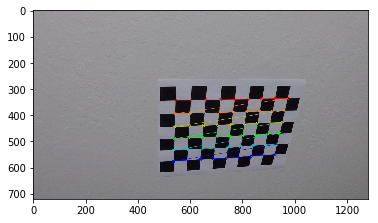

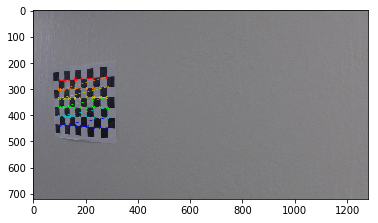

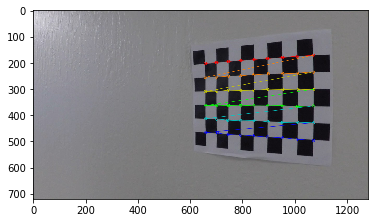

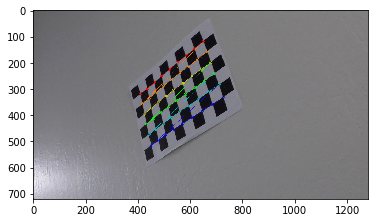

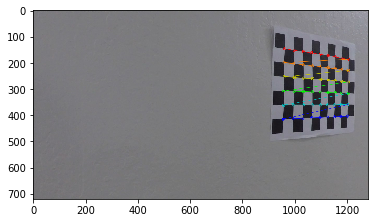

...

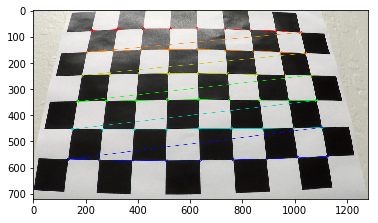

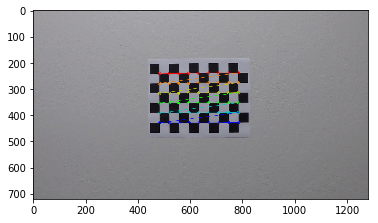

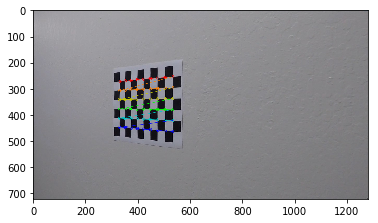

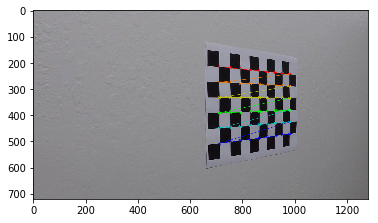

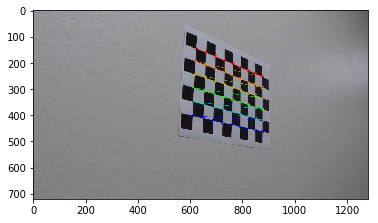

In [7]:
ret, mtx, dist, rvecs, tvecs = calibrateCamera()

In [8]:
# This method takes the camera matrix from CalibrateCamera method and returns the undistorted image
def undistortImage(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

## Visualize the results...

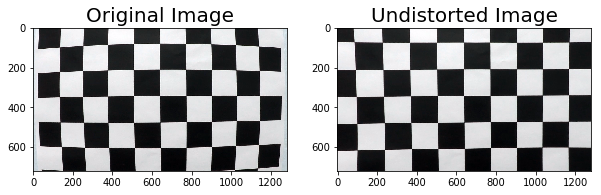

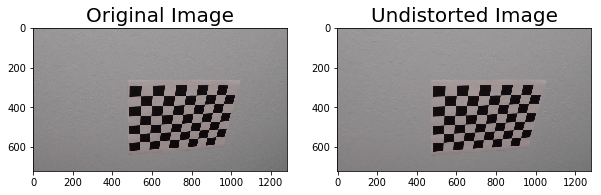

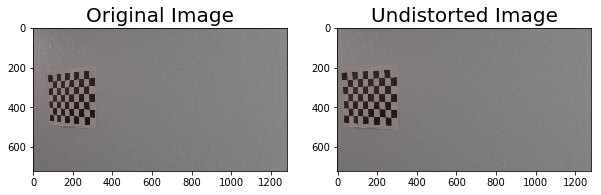

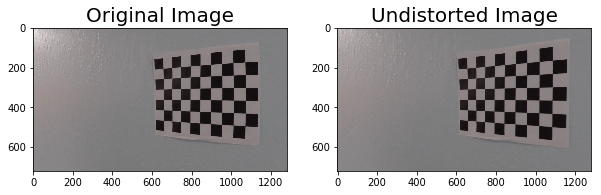

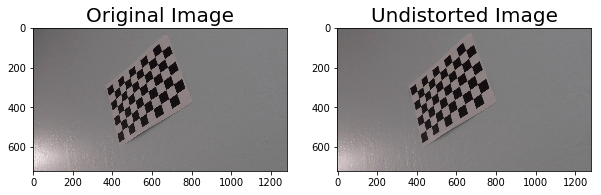

...

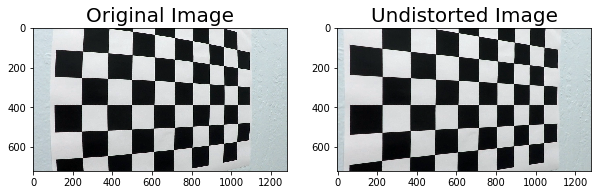

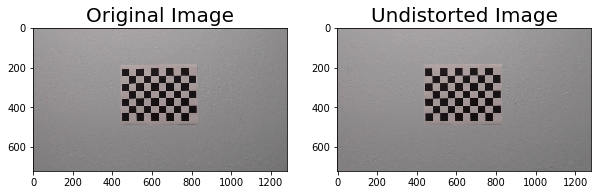

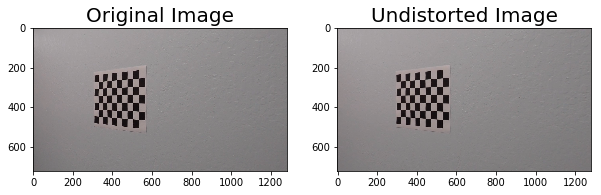

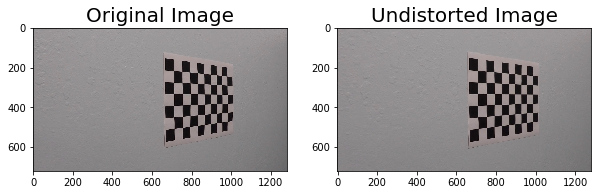

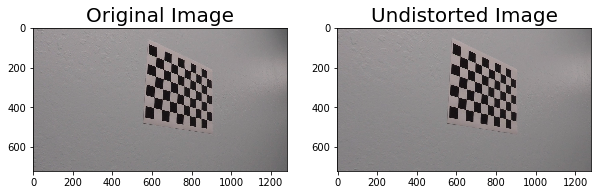

In [9]:
# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
for fname in images:
    img = cv2.imread(fname)
    dst = undistortImage(img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=20)

## Visualize on test images

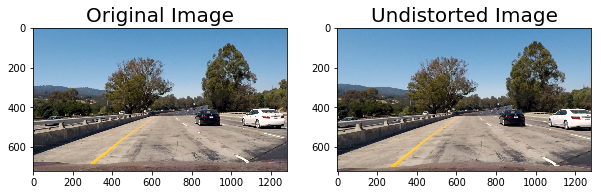

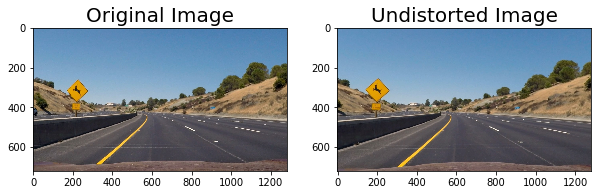

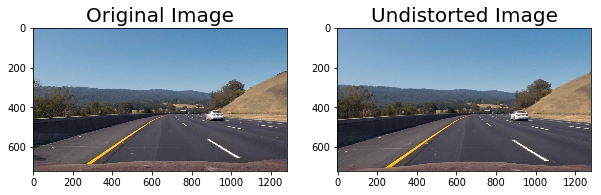

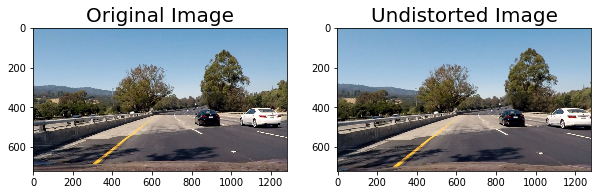

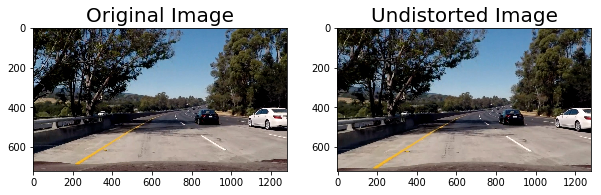

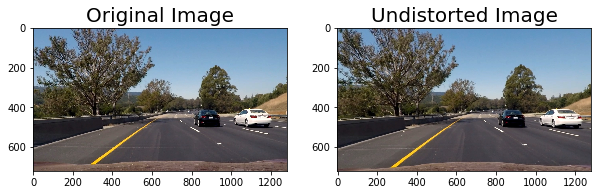

In [10]:
# Make a list of test images
test_images = glob.glob('test_images/test*.jpg')

for fname in test_images:
    img = cv2.imread(fname)
    dst = undistortImage(img)
    dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=20)

In [11]:
# This method performs the sobel transdormation of the image in 'x' or 'y' orientation
# This method also performs the normalization and returns the binary image
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Performing Sobel transform
    if (orient == 'x'):
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if (orient == 'y'):
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))

    # Normalization and binary image creation
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    sobelbinary = np.zeros_like(scaled_sobel)

    # Threasholding the image to fliter the unwanted areas of the given image
    sobelbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sobelbinary

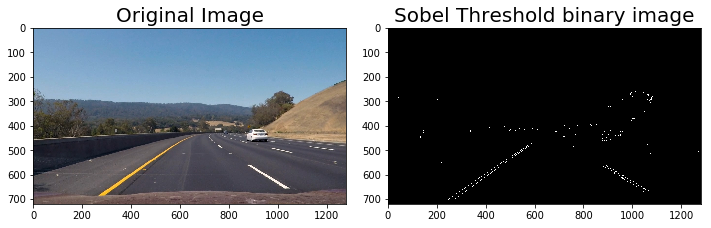

In [12]:
# Visualize Sobel Threshold binary image
test_image = cv2.imread('test_images/test3.jpg')

dst = undistortImage(test_image)
dstsobel = abs_sobel_thresh(dst, 'x',9, (70,110))

imgrgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
f.tight_layout()
ax1.imshow(imgrgb)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dstsobel, cmap='gray')
ax2.set_title('Sobel Threshold binary image', fontsize=20)

## Following are some alternate techniques which were tried, with results


In [13]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    abs_sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    abs_sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    
    gradmag = np.sqrt(abs_sobelx**2 + abs_sobely**2)
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    
    magbinary = np.zeros_like(gradmag)
    magbinary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1    
    return magbinary

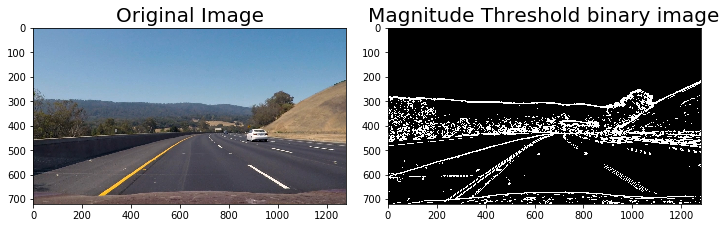

In [14]:
# Visualize Magnitude Threshold binary image
test_image = cv2.imread('test_images/test3.jpg')

dst = undistortImage(test_image)
dstsobel = mag_thresh(dst, 9, (15,100))

imgrgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
f.tight_layout()
ax1.imshow(imgrgb)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dstsobel, cmap='gray')
ax2.set_title('Magnitude Threshold binary image', fontsize=20)

In [15]:
def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    abs_sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    abs_sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    
    absgraddir = np.arctan2(abs_sobely, abs_sobelx)
    
    dirbinary = np.zeros_like(absgraddir)
    dirbinary[(absgraddir > thresh[0]) & (absgraddir <= thresh[1])] = 1
    return dirbinary

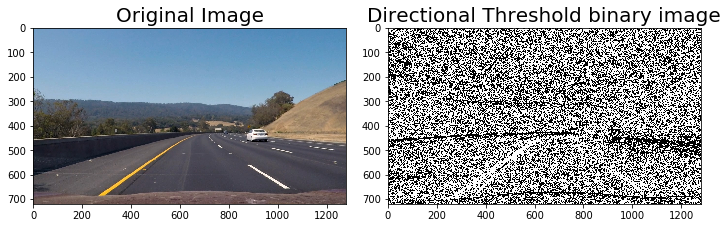

In [16]:
# Visualize Directional Threshold binary image
test_image = cv2.imread('test_images/test3.jpg')

dst = undistortImage(test_image)
dstsobel = dir_threshold(dst, 5, (0.3,1.3))

imgrgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
f.tight_layout()
ax1.imshow(imgrgb)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dstsobel, cmap='gray')
ax2.set_title('Directional Threshold binary image', fontsize=20)

In [17]:
# This method converts the image to HLS color space and separate the S channel
# It also performs the thresholding and returns the binary image
def getSChannelBinaryImage(dst, thresh=(0, np.pi/2)):

    hls = cv2.cvtColor(dst, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return s_binary

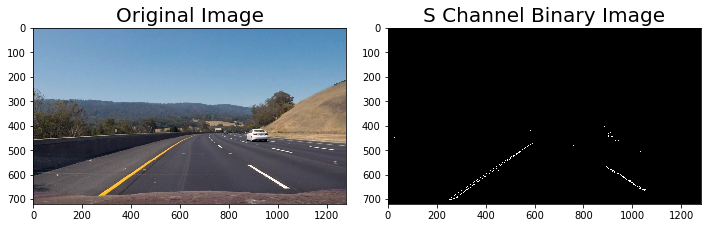

In [18]:
# Visualize S Channel binary image
test_image = cv2.imread('test_images/test3.jpg')

dst = undistortImage(test_image)
dst = getSChannelBinaryImage(dst,(170,240))

imgrgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
f.tight_layout()
ax1.imshow(imgrgb)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dst, cmap='gray')
ax2.set_title('S Channel Binary Image', fontsize=20)

In [19]:
# Extracting B channel from LAB color space
def getBChannelImage(img, thresh=(0, 255)):
    lab = cv2.cvtColor(img,cv2.COLOR_BGR2LAB)
    L, a, b = cv2.split(lab)
    b_binary = np.zeros_like(b)
    b_binary[(b > thresh[0]) & (b <= thresh[1])] = 1
    return b_binary

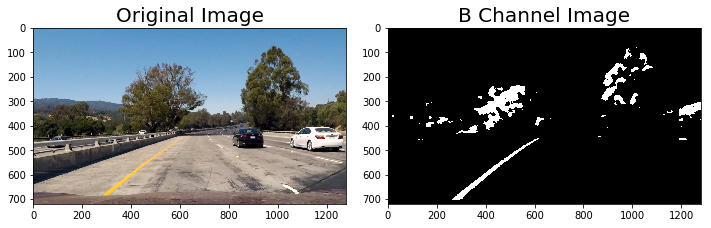

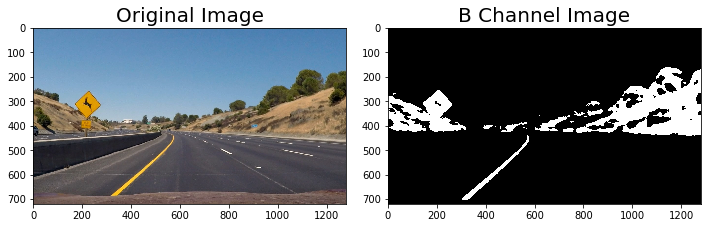

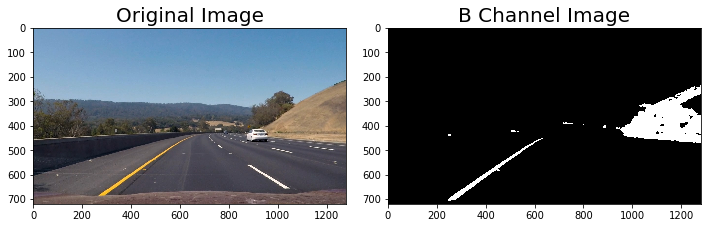

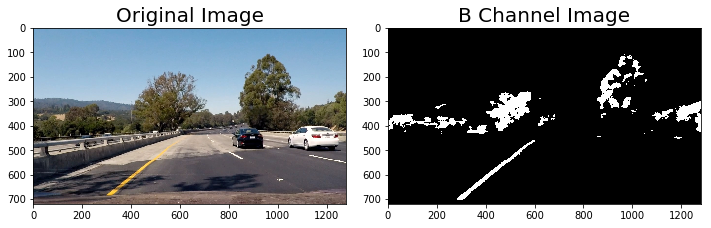

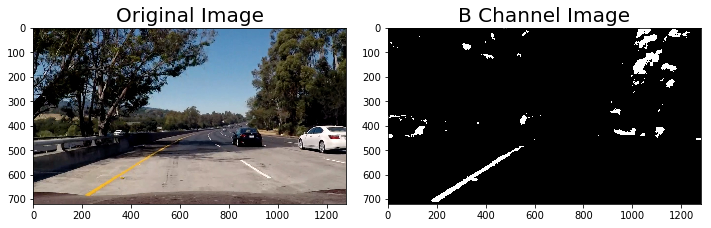

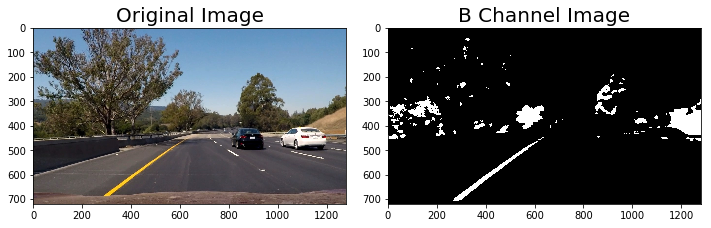

In [20]:
for fname in test_images:
    test_image = cv2.imread(fname)
    dst = undistortImage(test_image)
    dst = getBChannelImage(dst, (145, 255))

    imgrgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
    f.tight_layout()
    ax1.imshow(imgrgb)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(dst, cmap='gray')
    ax2.set_title('B Channel Image', fontsize=20)

In [21]:
# Extracting L channel from LUV color space
def getLChannelImage(img, thresh=(0, 255)):
    luv = cv2.cvtColor(img,cv2.COLOR_BGR2LUV)
    l, u, v = cv2.split(luv)
    l_binary = np.zeros_like(l)
    l_binary[(l > thresh[0]) & (l <= thresh[1])] = 1
    return l_binary

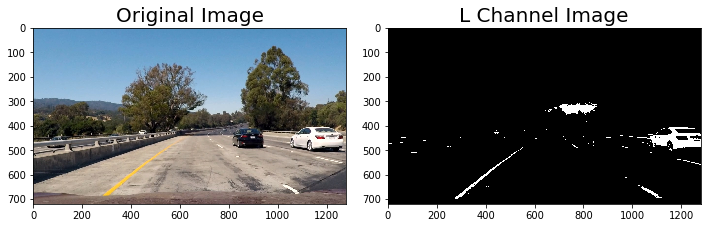

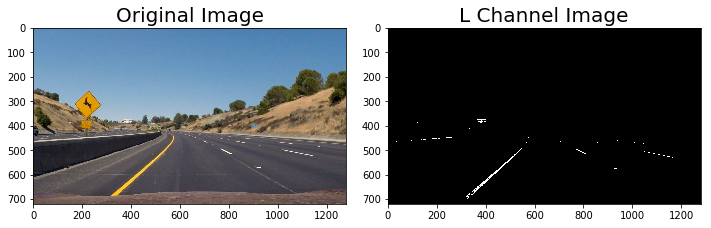

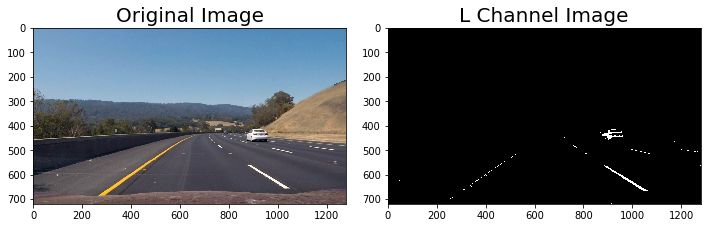

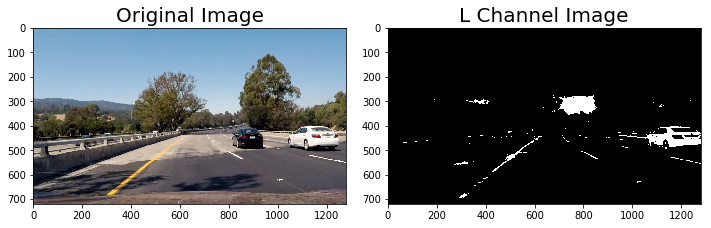

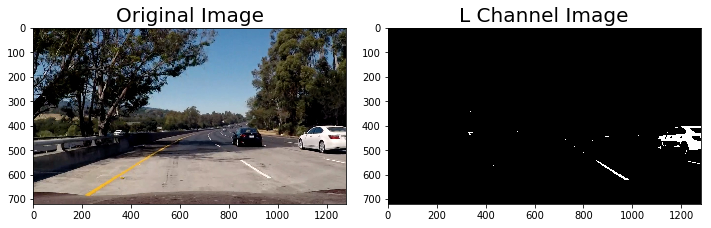

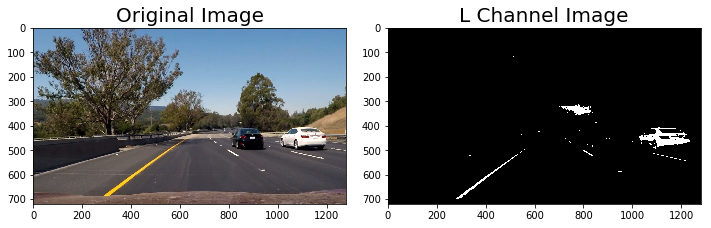

In [22]:
test_images = glob.glob('test_images/test*.jpg')

for fname in test_images:
    test_image = cv2.imread(fname)
    dst = undistortImage(test_image)
    dst = getLChannelImage(dst, (210, 255))

    imgrgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
    f.tight_layout()
    ax1.imshow(imgrgb)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(dst, cmap='gray')
    ax2.set_title('L Channel Image', fontsize=20)

In [23]:
# This method takes 2 binary images and combines them to create a combined image
# This is an important part of project, because only single transformed image is not sufficient
def combineBinaryImages(img1, img2):
    combined = np.zeros_like(img1)
    combined[(img1 == 1) | (img2 == 1)] = 1

    return combined

## Following are some combination results..

In [28]:
#Visualizing combination of different binary images
test_image = cv2.imread('test_images/test3.jpg')

image = undistortImage(test_image)
# Choose a Sobel kernel size
ksize = 9 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(70, 110))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(70, 110))

mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(70, 110))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))

bBinary = getBChannelImage(image, (145, 255))
LchImage = getLChannelImage(image, (210, 255))

schannel_binary = getSChannelBinaryImage(image, (170,240))

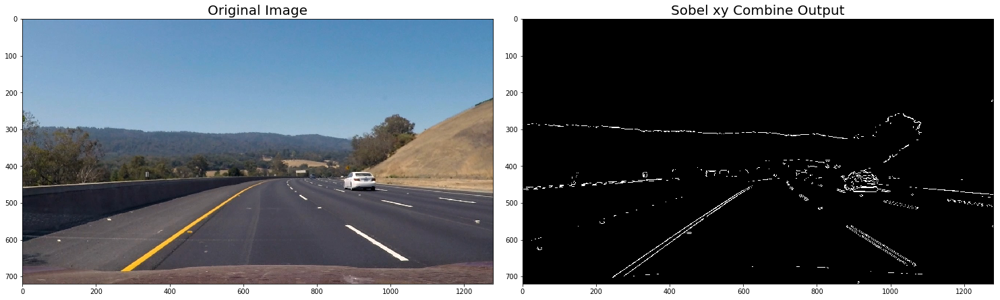

In [29]:
#Combine X and Y Sobel Image
combine = combineBinaryImages(gradx, grady)
imgrgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,20))
f.tight_layout()

ax1.imshow(imgrgb)
ax1.set_title('Original Image', fontsize=20)

ax2.imshow(combine, cmap='gray')
ax2.set_title('Sobel xy Combine Output', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

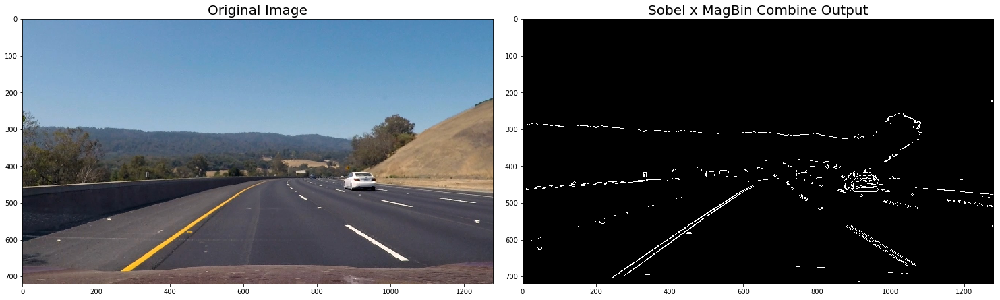

In [30]:
#Combine mag_binary and SobelX Image
combine = combineBinaryImages(gradx, mag_binary)
imgrgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,20))
f.tight_layout()

ax1.imshow(imgrgb)
ax1.set_title('Original Image', fontsize=20)

ax2.imshow(combine, cmap='gray')
ax2.set_title('Sobel x MagBin Combine Output', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

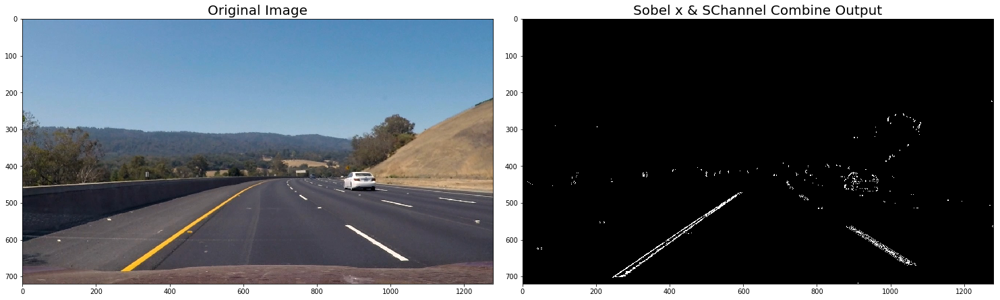

In [31]:
#Combine schannel_binary and SobelX Image
combine = combineBinaryImages(gradx, schannel_binary)
imgrgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,20))
f.tight_layout()

ax1.imshow(imgrgb)
ax1.set_title('Original Image', fontsize=20)

ax2.imshow(combine, cmap='gray')
ax2.set_title('Sobel x & SChannel Combine Output', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

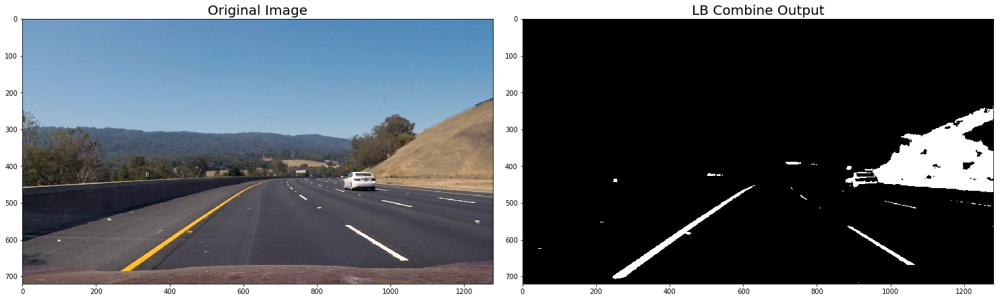

In [32]:
#Combining L and B channel binaries
combine = combineBinaryImages(bBinary, LchImage)

imgrgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,20))
f.tight_layout()

ax1.imshow(imgrgb)
ax1.set_title('Original Image', fontsize=20)

ax2.imshow(combine, cmap='gray')
ax2.set_title('LB Combine Output', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## It can easily seen that the result from combining BChannel binary and L Channel binary are better than the other combinations, hence the same combination is used in project

In [33]:
src = np.float32(
    [
        [1210, 710],  # Bottom right
        [160, 710],  # Bottom left
        [580, 460],  # Top left
        [735, 460]  # Top right
    ])

dst = np.float32(
    [
        [1020, 720],  # Bottom right
        [280, 720],  # Bottom left
        [280, 1],  # Top left
        [1020, 1],  # Top right
    ])

# This method extracts the given area in an image and performs the perspective transform to the given destination points
# It also returns the perspective and inverse perspective matrix, which are important parameters to
# redraw the selected area on the final image. It also returns the warped image
def perspectiveTransform(img, src, dst):
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst,src)
    # Warp the image using OpenCV warpPerspective()
    ysize, xsize = img.shape[0:2]
    warped = cv2.warpPerspective(img, M, (xsize,ysize), flags=cv2.INTER_LINEAR)
    # Return the resulting image and matrix
    return warped, M, Minv

## Visualizing perspective transformed image..

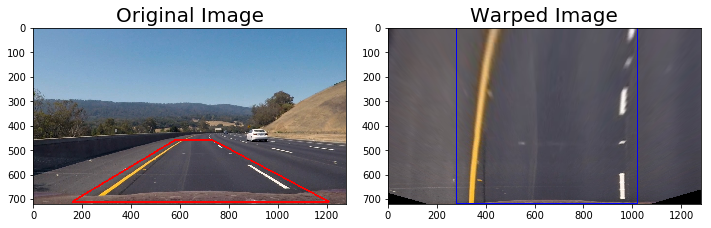

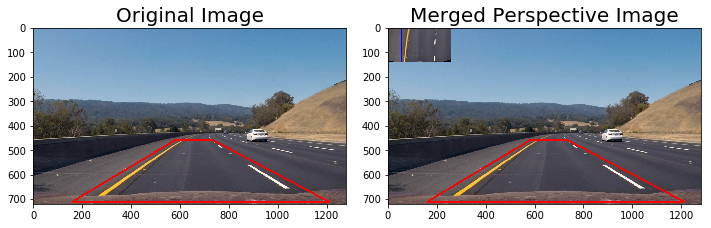

In [34]:
test_image = cv2.imread('test_images/test3.jpg')
undistorted = undistortImage(test_image)

warped, M, Minv = perspectiveTransform(undistorted, src, dst)
imgrgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
warped1 = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)
cv2.polylines(imgrgb,np.int32([src]),True,(255,0,0), 5)
cv2.polylines(warped1,np.int32([dst]),True,(0,0,255), 5)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
f.tight_layout()
ax1.imshow(imgrgb)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(warped1)
ax2.set_title('Warped Image', fontsize=20)

res = cv2.resize(warped1,None,fx=0.2, fy=0.2, interpolation = cv2.INTER_CUBIC)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
f.tight_layout()
ax1.imshow(imgrgb)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(res)
ax2.set_title('Merged Perspective Image', fontsize=20)

imgrgb[0:res.shape[0], 0:res.shape[1]] = res
plt.imshow(imgrgb)

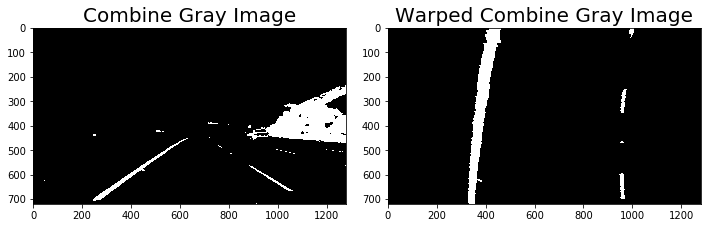

In [35]:
warpedCombine, M, Minv = perspectiveTransform(combine, src, dst)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
f.tight_layout()

ax1.imshow(combine, cmap='gray')
ax1.set_title('Combine Gray Image', fontsize=20)

ax2.imshow(warpedCombine, cmap='gray')
ax2.set_title('Warped Combine Gray Image', fontsize=20)

In [36]:
# This method returns the histogram of the given image, since we are interested in only lower half of the image so
# the shape of the image is divided by 2
def getHistogram(warpedCombine):
    return np.sum(warpedCombine[warpedCombine.shape[0]//2:,:], axis=0)   

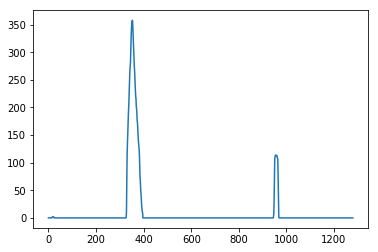

In [37]:
histogram = getHistogram(warpedCombine)
plt.plot(histogram)

In [38]:
# This method returns a blank image of the given image's shape
def createImageAs(warpedCombine):
    return np.dstack((warpedCombine, warpedCombine, warpedCombine))*255

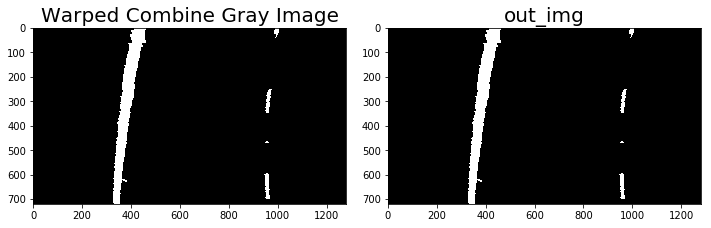

In [39]:
# Create an output image to draw on and  visualize the result
out_img = createImageAs(warpedCombine)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
f.tight_layout()

ax1.imshow(warpedCombine, cmap='gray')
ax1.set_title('Warped Combine Gray Image', fontsize=20)

ax2.imshow(out_img, cmap='gray')
ax2.set_title('out_img', fontsize=20)

In [40]:
#  This method performs the sliding window search on the given image and tries to detect the lane lines
#  It finds the different non zero coordinates in X and Y direction in the given window +- margin
def slidingWindowSearch(warpedCombine, out_img, leftx_base, rightx_base, numOfWindows=9, widthOfWin=200,
                        detectParam=50):
    # Defining the number of sliding windows
    nwindows = numOfWindows
    # Setting the height of windows
    window_height = np.int(warpedCombine.shape[0] / nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warpedCombine.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Setting the width of the windows +/- margin
    margin = np.int(widthOfWin / 2)

    # Setting the minimum number of pixels found to recenter window
    minpix = detectParam

    # Creating empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Stepping through the windows one by one
    for window in range(nwindows):
        # Defining window boundaries in x and y (and right and left)
        win_y_low = warpedCombine.shape[0] - (window + 1) * window_height
        win_y_high = warpedCombine.shape[0] - window * window_height

        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Identifying the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (
            nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (
            nonzerox < win_xright_high)).nonzero()[0]

        # Appending these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If we found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    return left_lane_inds, right_lane_inds, nonzerox, nonzeroy

In [41]:
# This method performs the search for lane in the previous frame's identified region
# Once we know the lane position in one frame then we can perform the concentrated search
# on the previous detected area
def knownLaneDetection(warpedCombine, left_fit, right_fit):

    nonzero = warpedCombine.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100

    left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2] - margin)) & (
        nonzerox < (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2] + margin)))
    right_lane_inds = (
        (nonzerox > (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2] - margin)) & (
            nonzerox < (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2] + margin)))

    return left_lane_inds, right_lane_inds, nonzerox, nonzeroy

In [42]:
# This method tries to fit the given order polynomial to find the X and Y regions on image indies
# Image indies are generated as output of slidingWindowSearch or knownLaneDetection method
def fitPolynomial(warpedCombine, left_lane_inds, right_lane_inds, nonzerox, nonzeroy, polyOrder=2):
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a given order polynomial to each
    left_fit = np.polyfit(lefty, leftx, polyOrder)
    right_fit = np.polyfit(righty, rightx, polyOrder)

    # Generating x and y values for plotting -  Ay^2 + By + C
    ploty = np.linspace(0, warpedCombine.shape[0] - 1, warpedCombine.shape[0])

    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]

    return left_fitx, right_fitx, ploty, left_fit, right_fit, leftx, rightx

In [78]:
# This method returns the curvature of the lanes based on the given Left and Right coordinates
def getCurvature(leftx, rightx, ploty):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 25 / 720  # meters per pixel in y dimension
    xm_per_pix = 3.7 / 720  # meters per pixel in x dimension

    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, rightx * xm_per_pix, 2)

    # Calculate the new radii of curvature
    #(ref: http://www.intmath.com/applications-differentiation/8-radius-curvature.php)
    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * right_fit_cr[0])

    return left_curverad, right_curverad


In [79]:
# This method finds the vehicle position from the lane center and saves the drifted postion in
# Class Line's instance 'lastFrameData'
def handleVehPositionFromCenter(leftx_base, rightx_base, imageMidpoint):

    xm_per_pix = 3.7 / 740  # meters per pixel in x dimension
    detectedCenter = (leftx_base + rightx_base) / 2
    position = (imageMidpoint - detectedCenter)
    positionInMtr = position * xm_per_pix
    # Saving the data to class instance
    lastFrameData.saveVehiclePositionFromCenter(positionInMtr)

In [80]:
# This method implements the algorithm to detect lane in the given image
def findLaneLines(histogram, warpedCombine, out_img, numOfWindows=9, widthOfWin=200, detectParam=50):
    # Calculate the image mid point
    midpoint = np.int(histogram.shape[0] / 2)
    # Find the left and right max intensity postions in X direction
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # Find vehicle postion from center and save in Class instance "lastFrameData"
    handleVehPositionFromCenter(leftx_base, rightx_base, midpoint)

    newLeftBase = leftx_base
    newRightBase = rightx_base

    # IF there there was no lane detected or if there were bad frames for continuous 8 times then
    # perform Sliding window search to search lane from scratch
    if (lastFrameData.wasLaneDetectedInLastFrame()):
        # Retreive stored data from class instance
        p_left_fitx, p_right_fitx, p_ploty, p_left_fit, p_right_fit = lastFrameData.getPreviousData()
        p_leftx_base, p_rightx_base = lastFrameData.getLastHistData()

        # These variables determine if right or left lane was not detected in the given margin of the
        # old position of the detected lane from previous frame
        lSimilarToPrev, rSimilarToPrev = False, False

        # Search and update the flags if the new lanes are detected in the given margin from the previous frame
        # If the left or right lane was not the same from previous frame then retain the previous frame's
        # data and increment the bad frame count
        if (np.abs(p_leftx_base - leftx_base) <= 80):
            lSimilarToPrev = True
        else:
            newLeftBase = p_leftx_base

        if (np.abs(p_rightx_base - rightx_base) <= 80):
            rSimilarToPrev = True
        else:
            newRightBase = p_rightx_base

        # If both lanes were not detected within margin area of the previous frame, then perform Sliding window
        # to search lanes from the scratch, also fit the polinomial of the given order
        if ((lSimilarToPrev == False) and (rSimilarToPrev == False)):
            lastFrameData.updateDetectedSave(True)
            lastFrameData.updateBadFrameCount(0)

            left_lane_inds, right_lane_inds, nonzerox, nonzeroy = slidingWindowSearch(warpedCombine, out_img,
                                                                                      newLeftBase, newRightBase,
                                                                                      numOfWindows, widthOfWin,
                                                                                      detectParam)
            newleft_fitx, newright_fitx, newploty, newleft_fit, newright_fit, newleftx, newrightx = fitPolynomial(
                warpedCombine,
                left_lane_inds,
                right_lane_inds, nonzerox,
                nonzeroy, 2)
        # If any one or both the lanes were detected at same postion +/- margin of the previous frame,
        # Then perform the search in the previous frame's reagion and
        # also update the bad frame flag accordingly, also fit the polinomial of the given order
        else:
            newleft_fit = p_left_fit
            newright_fit = p_right_fit

            left_lane_inds, right_lane_inds, nonzerox, nonzeroy = knownLaneDetection(warpedCombine, newleft_fit,
                                                                                     newright_fit)
            newleft_fitx, newright_fitx, newploty, newleft_fit, newright_fit, newleftx, newrightx = fitPolynomial(
                warpedCombine,
                left_lane_inds,
                right_lane_inds, nonzerox,
                nonzeroy, 2)

            if (lSimilarToPrev == False):
                newleft_fitx = p_left_fitx
                newleft_fit = p_left_fit
                lastFrameData.updateBadFrameCount(lastFrameData.getBadFrameCount() + 1)

            if (rSimilarToPrev == False):
                newright_fitx = p_right_fitx
                newright_fit = p_right_fit
                lastFrameData.updateBadFrameCount(lastFrameData.getBadFrameCount() + 1)

            if ((lSimilarToPrev == True) and (rSimilarToPrev == True)):
                lastFrameData.updateBadFrameCount(0)

            if (lastFrameData.getBadFrameCount() > 8):
                lastFrameData.updateDetectedSave(False)

    else:
        lastFrameData.updateDetectedSave(True)
        lastFrameData.updateBadFrameCount(0)

        left_lane_inds, right_lane_inds, nonzerox, nonzeroy = slidingWindowSearch(warpedCombine, out_img, newLeftBase,
                                                                                  newRightBase, numOfWindows,
                                                                                  widthOfWin,
                                                                                  detectParam)
        newleft_fitx, newright_fitx, newploty, newleft_fit, newright_fit, newleftx, newrightx = fitPolynomial(
            warpedCombine, left_lane_inds,
            right_lane_inds, nonzerox,
            nonzeroy, 2)

    # Find and update the Class instance with the Lane curvature
    leftC, RightC = getCurvature(newleft_fitx, newright_fitx, newploty)
    lastFrameData.saveRadiusOfCurvature((leftC + RightC) / 2)
    # Save the data to Class instance for further processing on next frames
    lastFrameData.savePolyData(newleft_fitx, newright_fitx, newploty, newleft_fit, newright_fit)
    lastFrameData.saveHistBase(newLeftBase, newRightBase)

    return newleft_fitx, newright_fitx, newploty, newleft_fit, newright_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy

## Visualize the detected Lanes..

Left and Right Fit:  [  1.21955911e-04  -2.17455289e-01   4.35386449e+02] [  1.68271878e-04  -1.72404851e-01   9.98326663e+02]


(720, 0)

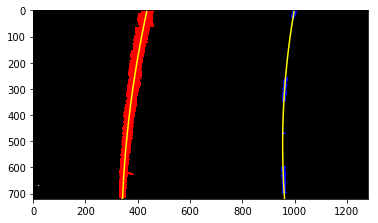

In [81]:
left_fitx, right_fitx, ploty, left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy  = findLaneLines(histogram, warpedCombine, out_img)
print ("Left and Right Fit: ", left_fit, right_fit)

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [82]:
# This method performs the inverse perspective transform and fills the color on the
# final image on the given detected areas
def fillFinalImage(undistortRgb, warpedCombine, left_fitx, right_fitx, ploty, Minv):
    # Creating an image to draw the lines on
    warp_zero = np.zeros_like(warpedCombine).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recasting the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Drawing the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warping the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undistortRgb.shape[1], undistortRgb.shape[0]))
    # Combining the result with the original image
    result = cv2.addWeighted(undistortRgb, 1, newwarp, 0.3, 0)
    return result

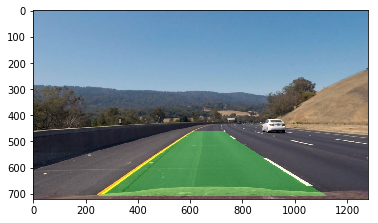

In [83]:
test_image = cv2.imread('test_images/test3.jpg')
undistorted = undistortImage(test_image)
undistortRgb = cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB)
result = fillFinalImage(undistortRgb, warpedCombine, left_fitx, right_fitx, ploty, Minv)
plt.imshow(result)

In [84]:
# This method writes the given text on the given image at the given coordinate
def writeOnImage(img, text, coOrd = (100,150)):
    font = cv2.FONT_HERSHEY_SIMPLEX
    return cv2.putText(img, text, coOrd, font, 1,(255,255,255),2,cv2.LINE_AA)

In [85]:
# This method performs the processing of the image to write different data on the final image.
def processForDetails(outputImg, undistortimage):
    # Retrieve the radius of curvature from the class instance, and write on image
    radius = lastFrameData.getRadiusOfCurvature()
    radius = float("{0:.3f}".format(radius))
    writeOnImage(outputImg, "Radius Of Curvature: " + str(radius), coOrd=(100, 200))

    # Retrieve the vehicle position from the center and write on the image
    vehPosition = lastFrameData.getVehiclePositionFromCenter()
    vehPosition = float("{0:.3f}".format(vehPosition))

    if (vehPosition > 0):
        writeOnImage(outputImg, "Vehicle Position From Center: " + str(vehPosition) + 'm (Right Side)',
                     coOrd=(100, 240))
    elif (vehPosition < 0):
        writeOnImage(outputImg, "Vehicle Position From Center: " + str(vehPosition) + 'm (Left Side)', coOrd=(100, 240))
    else:
        writeOnImage(outputImg, "Vehicle Position From Center: " + str(vehPosition) + 'm (+Center+)', coOrd=(100, 240))

    # Generate the undistorted warped image to embbed on the final image to show
    # real processed image for better understanding
    warped, Mlocal, Minvlocal = perspectiveTransform(undistortimage, src, dst)
    resized = cv2.resize(warped, None, fx=0.2, fy=0.2, interpolation=cv2.INTER_CUBIC)
    outputImg[0:resized.shape[0], 0:resized.shape[1]] = resized

    writeOnImage(outputImg, "<- Perspective Transformed Area", coOrd=(300, 100))
    return outputImg


In [86]:
#################################################################################################################
# This method consists of the real pipeline created for finding lane lines, it takes the image and performs
# series of operations and returns the final, filled and processed image
#################################################################################################################
def findLaneLinesPipeline(inputImg):
    # Undistort image
    undistortimage = undistortImage(inputImg)
    bBinary = getBChannelImage(cv2.cvtColor(undistortimage, cv2.COLOR_BGR2RGB), (145, 255))
    LBinary = getLChannelImage(undistortimage, (210, 255))
    combine = combineBinaryImages(LBinary, bBinary)
    # Performing perspective transform
    warpedCombine, M, Minv = perspectiveTransform(combine, src, dst)
    # Getting the histogram of the combined
    histogram = getHistogram(warpedCombine)
    # Creating an output image to draw on and  visualize the result
    out_img = createImageAs(warpedCombine)
    # Executing lane line finding algorithm
    left_fitx, right_fitx, ploty, left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = findLaneLines(
        histogram, warpedCombine, out_img)
    # Filling the final image's given region
    outputImg = fillFinalImage(undistortimage, warpedCombine, left_fitx, right_fitx, ploty, Minv)
    # Processing image to write details on it
    outputImg = processForDetails(outputImg, undistortimage)
    return outputImg


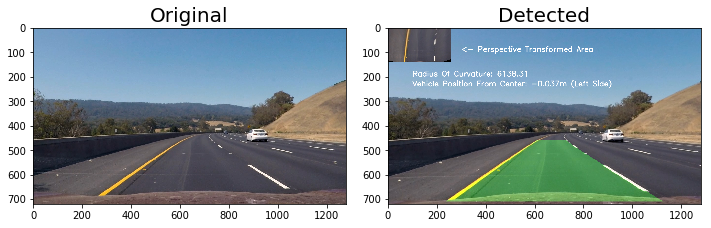

In [87]:
test_image = cv2.imread('test_images/test3.jpg')
lastFrameData.resetLaneData()
detectedimg = findLaneLinesPipeline(test_image)

test_imageRgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
detectedimgRgb = cv2.cvtColor(detectedimg, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,10))
f.tight_layout()

ax1.imshow(test_imageRgb, cmap='gray')
ax1.set_title('Original', fontsize=20)

ax2.imshow(detectedimgRgb, cmap='gray')
ax2.set_title('Detected', fontsize=20)

In [90]:
# Following code processes the given video's each frame with the LaneLine finding pipeline and creates the
# resulted video
from moviepy.editor import VideoFileClip
from IPython.display import HTML
def createOutVideo():
    white_output = 'project_result.mp4'
    clip1 = VideoFileClip("project_video.mp4")
    white_clip = clip1.fl_image(findLaneLinesPipeline) #NOTE: this function expects color images!!
    white_clip.write_videofile(white_output, audio=False)
    return white_clip

In [91]:
lastFrameData.resetLaneData()
white_clip = createOutVideo()

[MoviePy] >>>> Building video project_result.mp4
[MoviePy] Writing video project_result.mp4


100%|█████████▉| 1260/1261 [03:20<00:00,  5.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_result.mp4 



In [64]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_clip))